In [2]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
df = pd.read_csv('cleaned_data.csv')

In [5]:
# EDA
df.head()

,cds ID,length (bp),gc,gc1,gc2,gc3,enc,species,group
0,ENSATET00000036709.2,60,41.666667,40.000000,45.000000,40.000000,85.000000,Anabas_testudineus,fish
1,ENSATET00000036710.2,54,48.148148,50.000000,50.000000,44.444444,100.000000,Anabas_testudineus,fish
2,ENSATET00000036715.2,57,45.614035,36.842105,52.631579,47.368421,78.947368,Anabas_testudineus,fish
3,ENSATET00000062572.1,306,47.712418,45.098039,50.000000,48.039216,41.176471,Anabas_testudineus,fish
4,ENSATET00000055632.1,303,46.864686,41.584158,51.485149,47.524752,42.574257,Anabas_testudineus,fish


In [6]:

print("Shape of the DataFrame:", df.shape)

print("Data types of each column:")
print(df.dtypes)

print("Missing values:")
print(df.isnull().sum())

print("Descriptive statistics:")
print(df.describe())



Shape of the DataFrame: (1074770, 9)
Data types of each column:
cds ID          object
length (bp)      int64
gc             float64
gc1            float64
gc2            float64
gc3            float64
enc            float64
species         object
group           object
dtype: object
Missing values:
cds ID         0
length (bp)    0
gc             0
gc1            0
gc2            0
gc3            0
enc            0
species        0
group          0
dtype: int64
Descriptive statistics:
        length (bp)            gc           gc1           gc2           gc3  \
count  1.074770e+06  1.074770e+06  1.074770e+06  1.074770e+06  1.074770e+06   
mean   1.808867e+03  5.027491e+01  5.340188e+01  4.119593e+01  5.622703e+01   
std    1.698155e+03  7.455807e+00  6.876234e+00  6.704883e+00  1.463233e+01   
min    1.500000e+01  3.663004e+00  0.000000e+00  0.000000e+00  0.000000e+00   
25%    8.130000e+02  4.528438e+01  4.946004e+01  3.695238e+01  4.582393e+01   
50%    1.371000e+03  5.000000e+01  

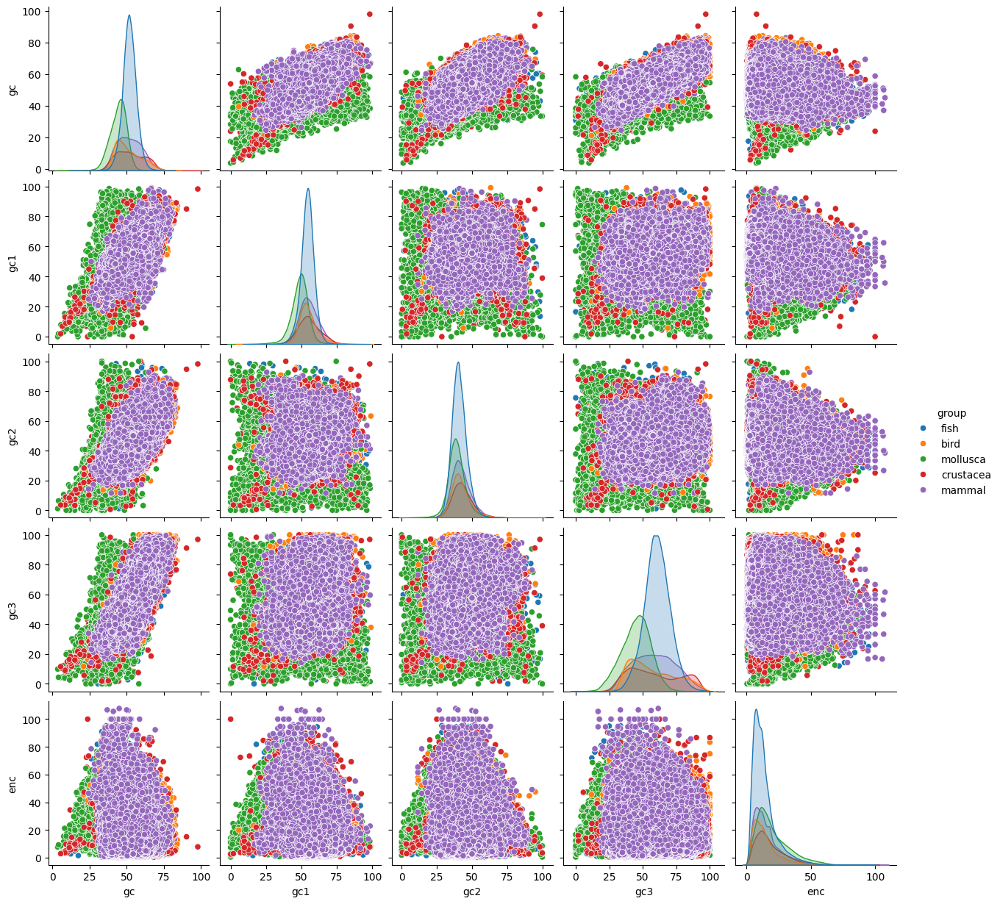

In [13]:
import seaborn as sns

numerical_columns = ['gc', 'gc1', 'gc2', 'gc3', 'enc']

numerical_df = df[numerical_columns + ['group']]

sns.pairplot(numerical_df, hue='group', s=.5, alpha=.5)


We can see the distribution of the datapoints based on the group .

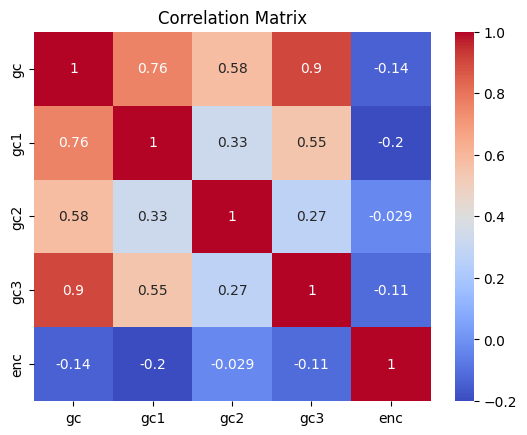

In [7]:
numerical_columns = ['gc', 'gc1', 'gc2', 'gc3', 'enc']

numerical_df = df[numerical_columns]

correlation_matrix = numerical_df.corr()

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


Through this correlation matrix we see that there is positive correlation between all features but the enc has the weak negative correlation with other features.

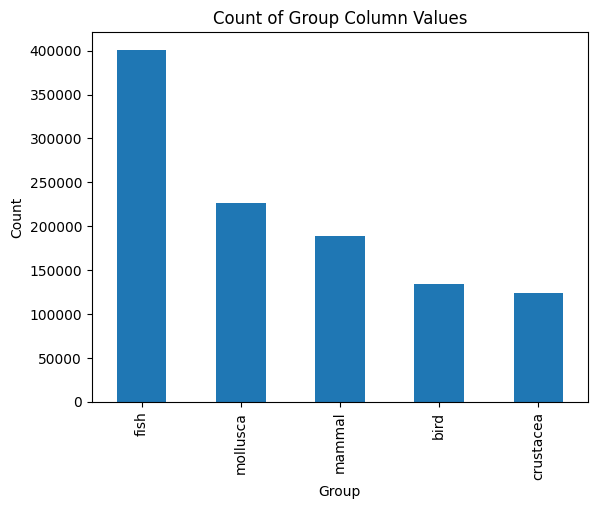

In [8]:
df['group'].value_counts().plot(kind='bar')
plt.xlabel('Group')
plt.ylabel('Count')
plt.title('Count of Group Column Values')
plt.show()


In [152]:
df['group'].value_counts()

group
fish         401206
mollusca     226833
mammal       188254
bird         134446
crustacea    124031
Name: count, dtype: int64

The fish has the largest datapoints and the crustacea group has the least datapoints. According to the barplot of the count of the datapoints based on group we can see the unbalanced distribution of the datapoints in this dataframe.

### Clustering with K-Means

In [7]:
from sklearn.metrics import silhouette_score
def scale_features(*args):
    scaler = MinMaxScaler()
    return scaler.fit_transform(df[list(args)])

def apply_pca(data):
    pca = PCA(n_components=2)
    return pca.fit_transform(data)

def plot_clusters(data_2d, labels, title):
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(data_2d[:, 0], data_2d[:, 1], c=labels, cmap='viridis',alpha=0.5)
    plt.title(title)
    legend1 = plt.legend(*scatter.legend_elements(),
                        loc="upper right", title="Clusters")
    plt.gca().add_artist(legend1)
    plt.show()

def silhouette_analysis(data, clusters):
    silhouette_avg = silhouette_score(data, clusters)
    print("Silhouette Score:", silhouette_avg)


Lets start with the K-Means clustering, we are normalizing the data then using the K-Means Clustering.

C:\Users\Devesh\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


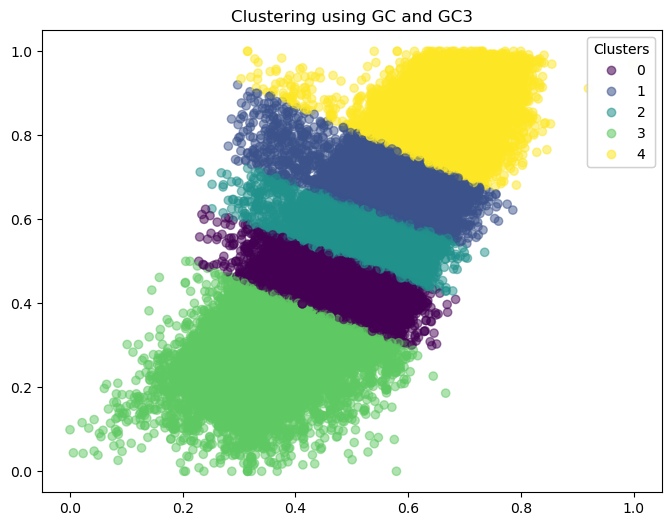

In [10]:
# 1. Clustering using GC and GC3
scaled_data = scale_features('gc', 'gc3')
kmeans = KMeans(n_clusters=5, random_state=42)
labels = kmeans.fit(scaled_data)
clusters = kmeans.predict(scaled_data)
plot_clusters(scaled_data, clusters, 'Clustering using GC and GC3')

In [ ]:
#silhouette_analysis(scaled_data, clusters)

In [255]:
from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

X_train, X_test, y_train, y_test = train_test_split(umap_df.drop('group', axis=1), umap_df['group'], test_size=0.2, random_state=42)
silhouette_scores = []

for random_state in range(5):
    gmm = GaussianMixture(n_components=5, random_state=random_state)
    

    gmm.fit(X_train)
    y_pred = gmm.predict(X_test)
    
    score = silhouette_score(X_test, y_pred)
    silhouette_scores.append(score)

best_model_index = silhouette_scores.index(max(silhouette_scores))
best_score = silhouette_scores[best_model_index]

best_model = GaussianMixture(n_components=5, random_state=best_model_index)

print("Best silhouette score:", best_score)
print("Best model:", best_model)


Best silhouette score: 0.10598170689342869
Best model: GaussianMixture(n_components=5, random_state=1)


In [ ]:
import numpy as np

def calculate_distance(data_point, centroids):
    distances = []
    for centroid in centroids:
        distance = np.sqrt(np.sum((data_point - centroid) ** 2))
        distances.append(distance)
    return distances


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

metrics = []


for i in range(5):

    kmeans = KMeans(n_clusters=5, random_state=i)
    
    kmeans.fit(data)
    
    score = silhouette_score(data, kmeans.labels_)
    

    metrics.append(score)


best_model_index = metrics.index(max(metrics))


best_metric = metrics[best_model_index]


best_model = KMeans(n_clusters=5, random_state=best_model_index)


print("Best metric value:", best_metric)
print("Best model:", best_model)


In [250]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
def centroid_finder_KMeans(df, column1, column2):
    data = df[[column1, column2]]
    
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(data)
    
    centroid_df = pd.DataFrame(columns=[column1, column2, 'group'])
    

    for group in df['group'].unique():
        group_data = scaled_data[df['group'] == group]
        
        kmeans = KMeans(n_clusters=5, random_state=42)
        kmeans.fit_predict(group_data)
        
        centroids = kmeans.cluster_centers_
        
        group_centroids_df = pd.DataFrame(centroids, columns=[column1, column2])
        group_centroids_df['group'] = group
        
        centroid_df = pd.concat([centroid_df, group_centroids_df], ignore_index=True)
    
    return centroid_df

In [251]:
centroid_df = centroid_finder_KMeans(df, 'gc', 'gc3')
centroid_df.head()

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\diwas\AppData\Local\Temp\ipykernel_12280\788745168.py:33: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in

,gc,gc3,group
0,0.592435,0.779181,fish
1,0.510081,0.601911,fish
2,0.428749,0.426750,fish
3,0.543938,0.678463,fish
4,0.477575,0.527650,fish


<Axes: xlabel='gc', ylabel='gc3'>

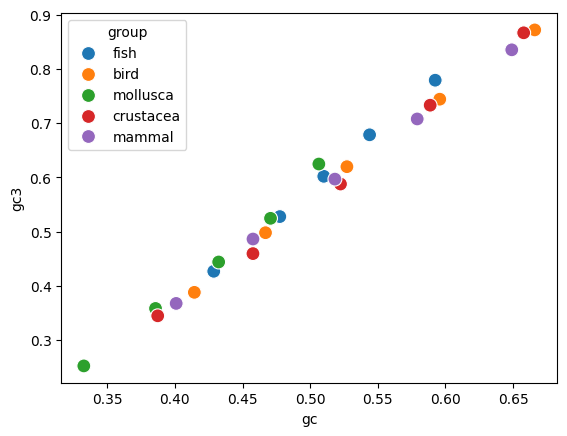

In [252]:
sns.scatterplot(x='gc', y='gc3', hue='group', data=centroid_df, s=100)

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



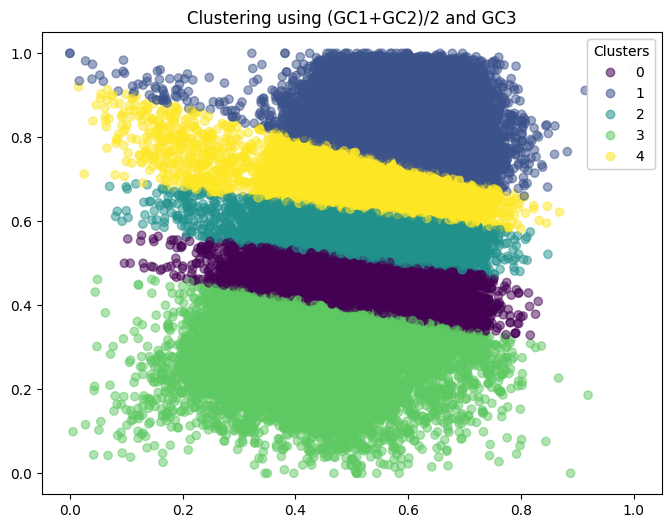

In [287]:
# 2. Clustering using (GC1+GC2)/2 and GC3
df['gc1_gc2_avg'] = df[['gc1', 'gc2']].mean(axis=1)
scaled_data = scale_features('gc1_gc2_avg', 'gc3')
clusters = kmeans.fit_predict(scaled_data)
plot_clusters(scaled_data, clusters, 'Clustering using (GC1+GC2)/2 and GC3')

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\diwas\AppData\Local\Temp\ipykernel_12280\788745168.py:33: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in

<Axes: xlabel='gc1_gc2_avg', ylabel='gc3'>

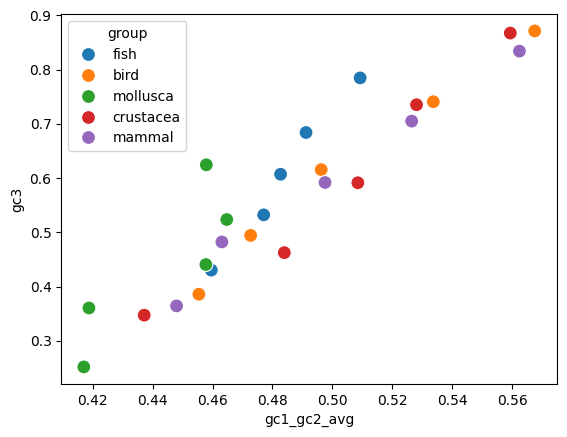

In [258]:
centroid_df = centroid_finder_KMeans(df, 'gc1_gc2_avg', 'gc3')
sns.scatterplot(x='gc1_gc2_avg', y='gc3', hue='group', data=centroid_df, s=100)

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



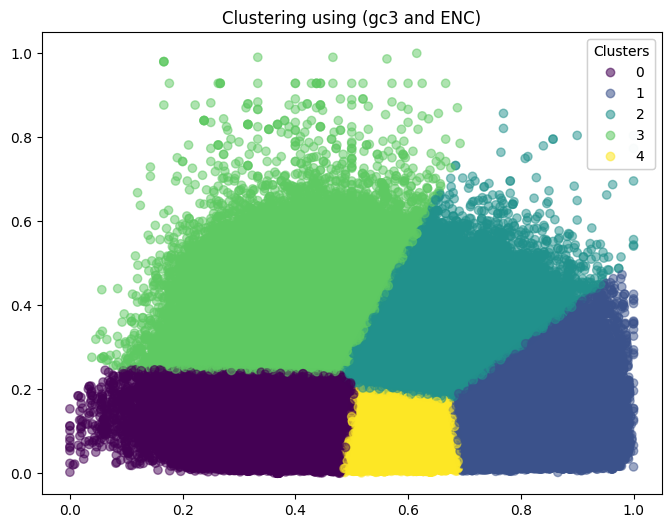

In [288]:
# 3. Clustering using (GC1+GC2)/2 and GC3
#df['gc1_gc2_avg'] = df[['gc1', 'gc2']].mean(axis=1)
scaled_data = scale_features('gc3', 'enc')
clusters = kmeans.fit_predict(scaled_data)
plot_clusters(scaled_data, clusters, 'Clustering using (gc3 and ENC)')

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\diwas\AppData\Local\Temp\ipykernel_12280\788745168.py:33: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in

<Axes: xlabel='gc3', ylabel='enc'>

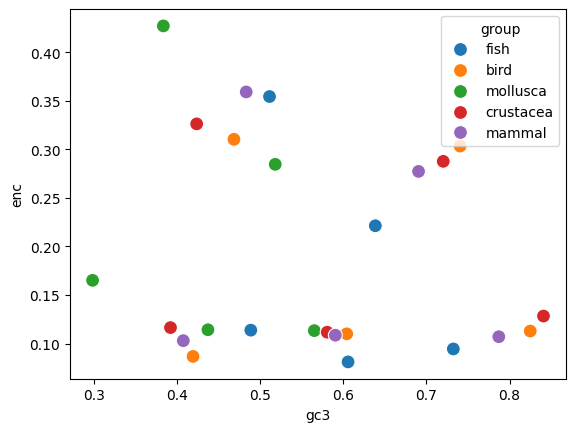

In [261]:
centroid_df = centroid_finder_KMeans(df, 'gc3', 'enc')
sns.scatterplot(x='gc3', y='enc', hue='group', data=centroid_df, s=100)

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



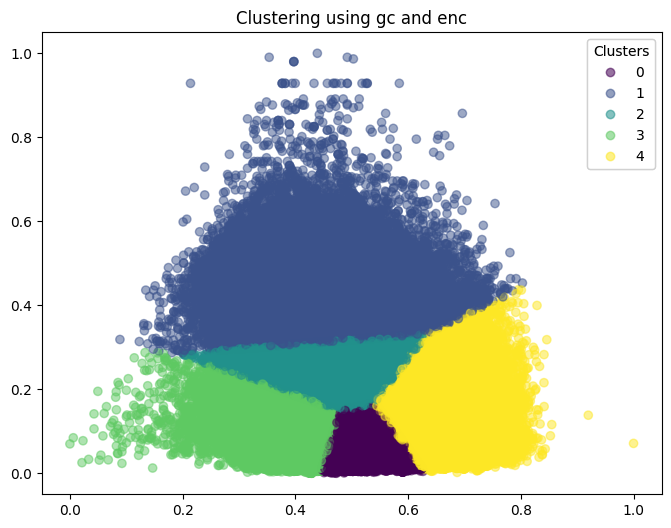

In [289]:
# 4. Clustering using GC and ENC
scaled_data = scale_features('gc', 'enc')
clusters = kmeans.fit_predict(scaled_data)
plot_clusters(scaled_data, clusters, 'Clustering using gc and enc')

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\diwas\AppData\Local\Temp\ipykernel_12280\788745168.py:33: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in

<Axes: xlabel='gc', ylabel='enc'>

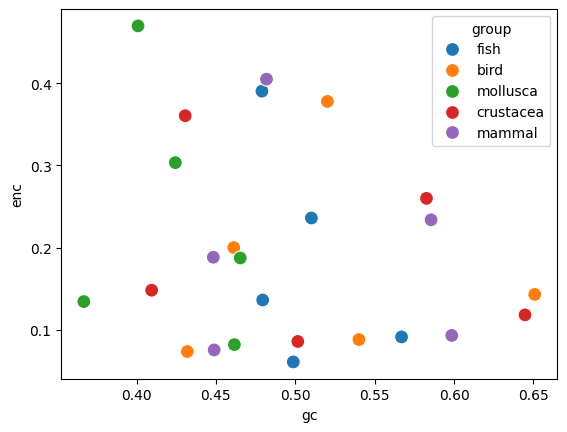

In [263]:
centroid_df = centroid_finder_KMeans(df, 'gc', 'enc')
sns.scatterplot(x='gc', y='enc', hue='group', data=centroid_df, s=100)

In [40]:
df["group"]

0            fish
1            fish
2            fish
3            fish
4            fish
            ...  
1074765    mammal
1074766    mammal
1074767    mammal
1074768    mammal
1074769    mammal
Name: group, Length: 1074770, dtype: object

In [41]:
df['group'] = df['group'].astype(str)

We saw the clustering using the K-Means. But we also want to see the distribution of data based on the groups. We are visualizing the scatterplot for this using diffeent features based on the group as color.

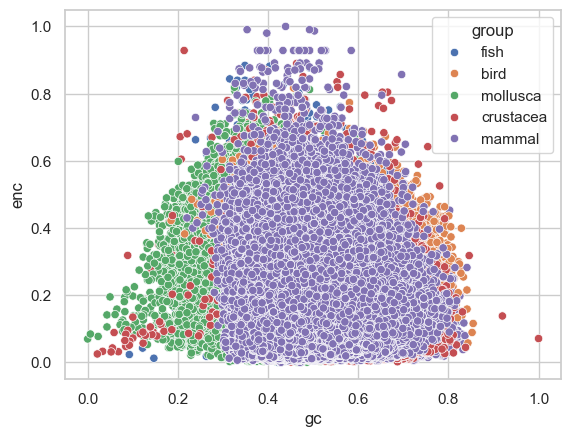

In [42]:
import seaborn as sns
sns.set(style="whitegrid")
scaled_df = pd.DataFrame(scaled_data, columns=['gc', 'enc'])
scaled_df['group'] = df["group"]
sns.scatterplot(x="gc", y="enc", hue="group", data=scaled_df)
plt.show()

In [219]:
df.head()

,cds ID,length (bp),gc,gc1,gc2,gc3,enc,species,group
0,ENSATET00000036709.2,60,41.666667,40.000000,45.000000,40.000000,85.000000,Anabas_testudineus,fish
1,ENSATET00000036710.2,54,48.148148,50.000000,50.000000,44.444444,100.000000,Anabas_testudineus,fish
2,ENSATET00000036715.2,57,45.614035,36.842105,52.631579,47.368421,78.947368,Anabas_testudineus,fish
3,ENSATET00000062572.1,306,47.712418,45.098039,50.000000,48.039216,41.176471,Anabas_testudineus,fish
4,ENSATET00000055632.1,303,46.864686,41.584158,51.485149,47.524752,42.574257,Anabas_testudineus,fish


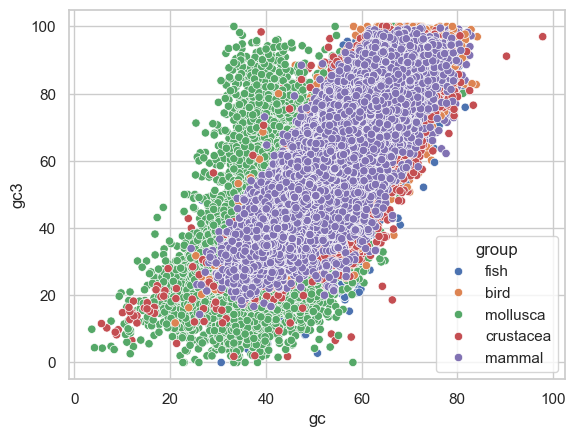

In [44]:
import seaborn as sns
sns.set(style="whitegrid")
sns.scatterplot(x="gc", y="gc3", hue="group", data=df)
plt.show()

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



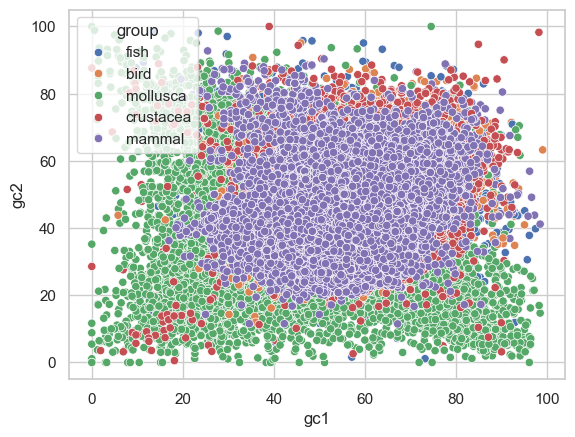

In [45]:
import seaborn as sns
sns.set(style="whitegrid")
sns.scatterplot(x="gc1", y="gc2", hue="group", data=df)
plt.show()

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



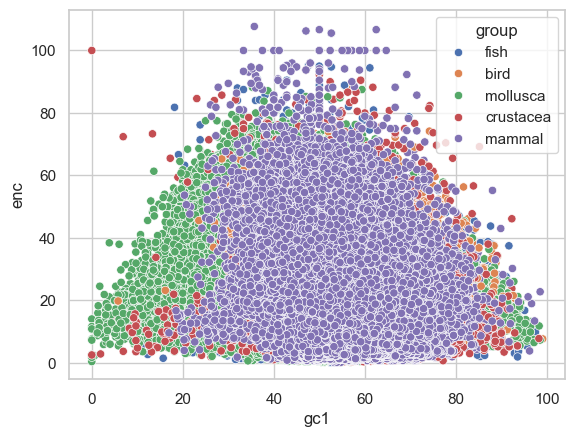

In [46]:
sns.scatterplot(x="gc1", y="enc", hue="group", data=df)
plt.show()

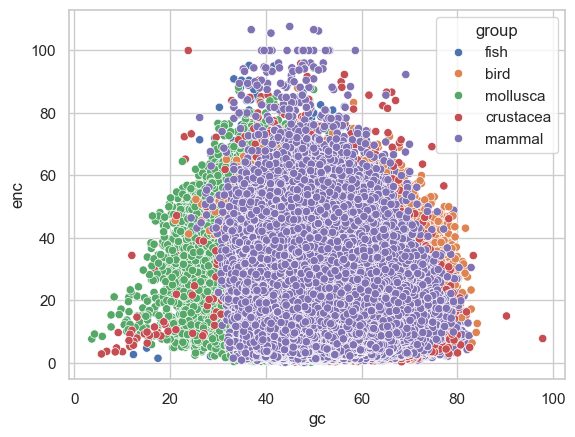

In [47]:
sns.scatterplot(x="gc", y="enc", hue="group", data=df)
plt.show()

We did analysis of the plot and we found there is overlap of the datapoints based on the group and there is no clear distinction between these datapoints.

## Clustering using Gaussian Mixture

In [272]:
def centroid_finder_GM(df, column1, column2):
    data = df[[column1, column2]]
    
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(data)
    
    centroid_df = pd.DataFrame(columns=[column1, column2, 'group'])
    
    for group in df['group'].unique():
        group_data = scaled_data[df['group'] == group]
        
        gmm = GaussianMixture(n_components=5, random_state=42)

        gmm.fit_predict(group_data)
        

        centroids = gmm.means_
        

        group_centroids_df = pd.DataFrame(centroids, columns=[column1, column2])
        group_centroids_df['group'] = group
        
        centroid_df = pd.concat([centroid_df, group_centroids_df], ignore_index=True)
    
    return centroid_df

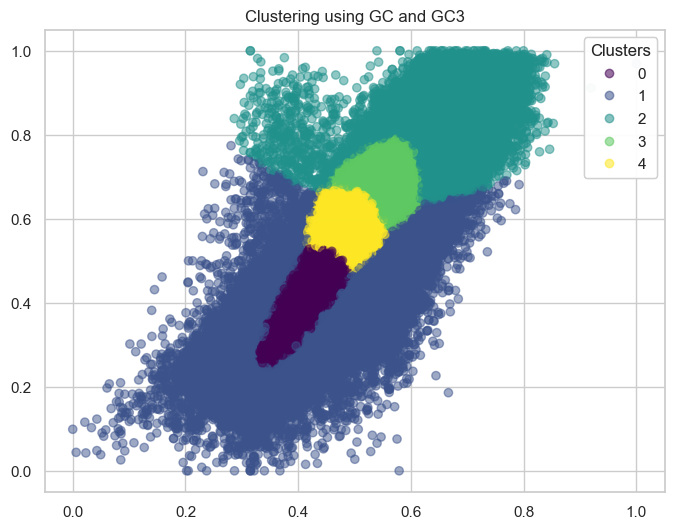

In [49]:
# 3. Clustering using GC3 and ENC
scaled_data = scale_features('gc', 'gc3')
gmm = GaussianMixture(n_components=5, random_state=42)
clusters = gmm.fit_predict(scaled_data)
plot_clusters(scaled_data, clusters, 'Clustering using GC and GC3')

C:\Users\diwas\AppData\Local\Temp\ipykernel_12280\1299215374.py:29: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



<Axes: xlabel='gc', ylabel='gc3'>

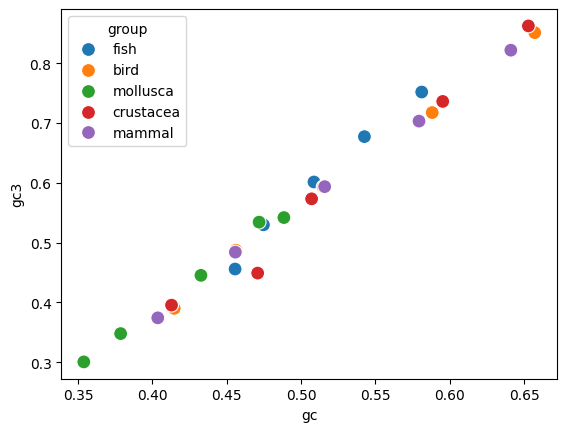

In [274]:
centroid_df = centroid_finder_GM(df, 'gc', 'gc3')
sns.scatterplot(x='gc', y='gc3', hue='group', data=centroid_df, s=100)

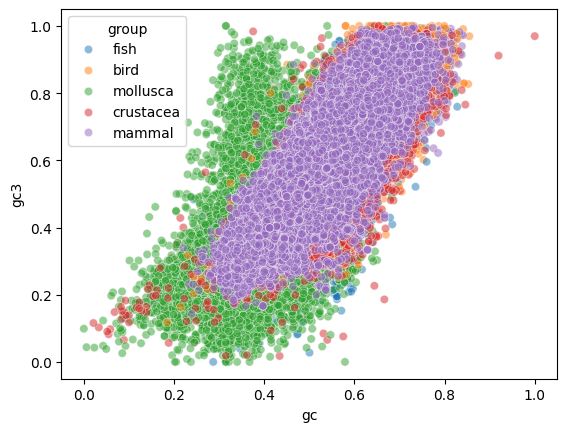

In [275]:
scaled_data = scale_features('gc', 'gc3')
scaled_df = pd.DataFrame(scaled_data, columns=['gc', 'gc3'])
scaled_df['group'] = df["group"]
sns.scatterplot(x="gc", y="gc3", hue="group", data=scaled_df,alpha=0.5)
plt.show()

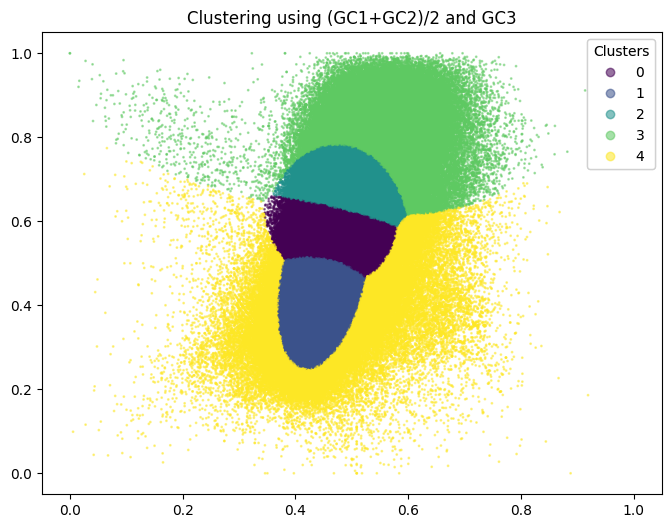

In [276]:
# 3. Clustering using GC3 and ENC
scaled_data = scale_features('gc1_gc2_avg', 'gc3')
gmm = GaussianMixture(n_components=5, random_state=42)
clusters = gmm.fit_predict(scaled_data)
plot_clusters(scaled_data, clusters, 'Clustering using (GC1+GC2)/2 and GC3')


C:\Users\diwas\AppData\Local\Temp\ipykernel_12280\1299215374.py:29: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



<Axes: xlabel='gc1_gc2_avg', ylabel='gc3'>

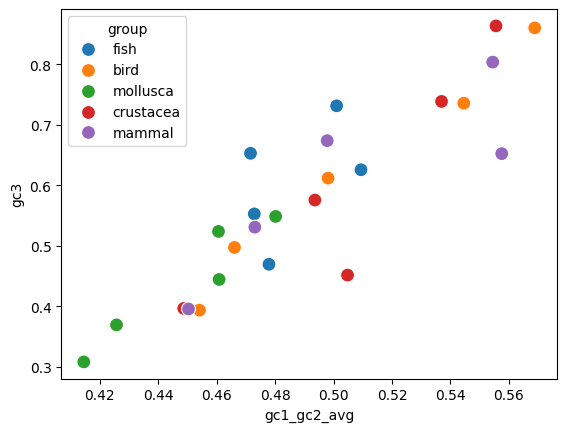

In [277]:
centroid_df = centroid_finder_GM(df, 'gc1_gc2_avg', 'gc3')
sns.scatterplot(x='gc1_gc2_avg', y='gc3', hue='group', data=centroid_df, s=100)

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



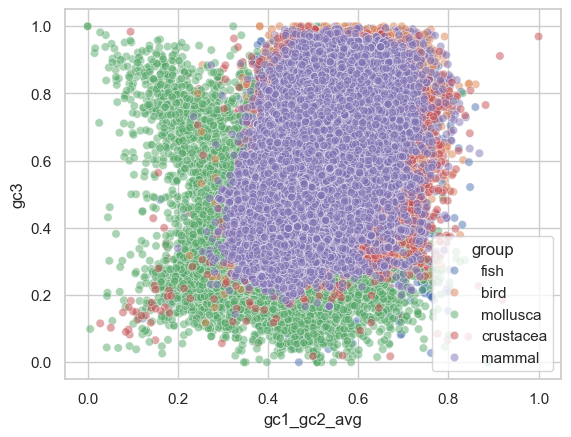

In [52]:
scaled_data = scale_features('gc1_gc2_avg', 'gc3')
scaled_df = pd.DataFrame(scaled_data, columns=['gc1_gc2_avg', 'gc3'])
scaled_df['group'] = df["group"]
sns.scatterplot(x="gc1_gc2_avg", y="gc3", hue="group", data=scaled_df,alpha=0.5)
plt.show()

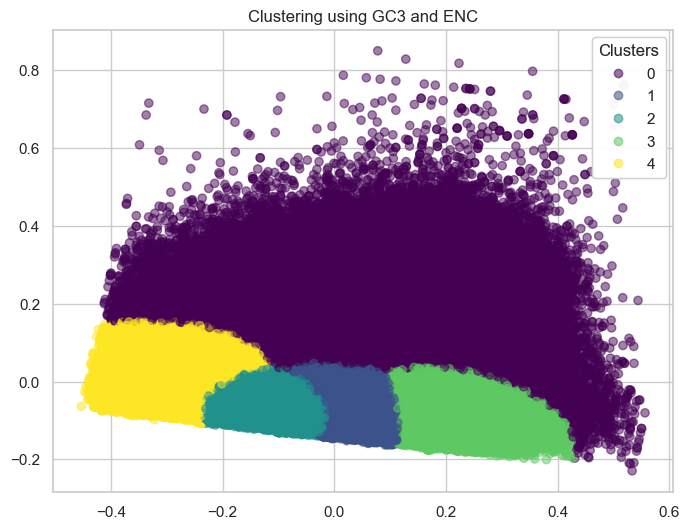

In [53]:

scaled_data = scale_features('gc3', 'enc')
gmm = GaussianMixture(n_components=5, random_state=42)
clusters = gmm.fit_predict(scaled_data)
plot_clusters(apply_pca(scaled_data), clusters, 'Clustering using GC3 and ENC')

C:\Users\diwas\AppData\Local\Temp\ipykernel_12280\1299215374.py:29: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



<Axes: xlabel='gc3', ylabel='enc'>

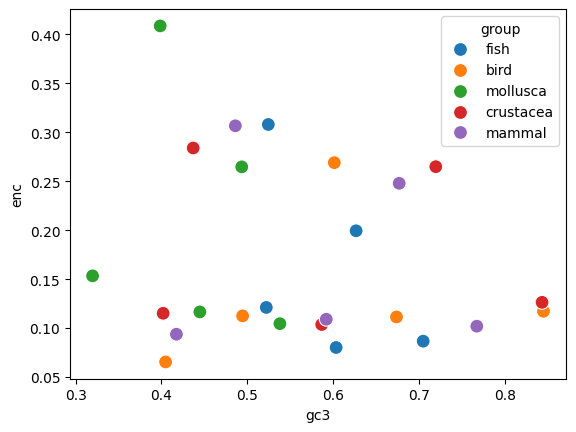

In [278]:
centroid_df = centroid_finder_GM(df, 'gc3', 'enc')
sns.scatterplot(x='gc3', y='enc', hue='group', data=centroid_df, s=100)

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



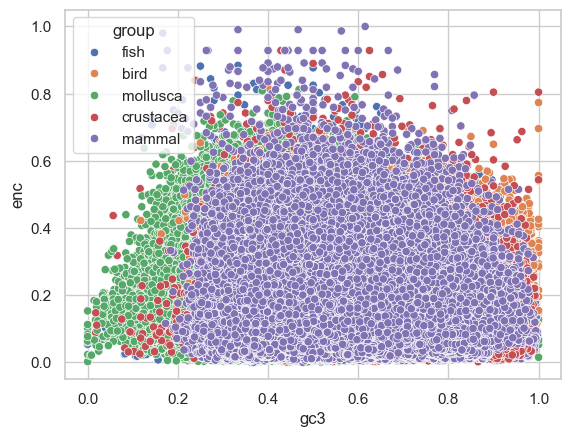

In [54]:
scaled_data = scale_features('gc3', 'enc')
scaled_df = pd.DataFrame(scaled_data, columns=['gc3', 'enc'])
scaled_df['group'] = df["group"]
sns.scatterplot(x="gc3", y="enc", hue="group", data=scaled_df)
plt.show()

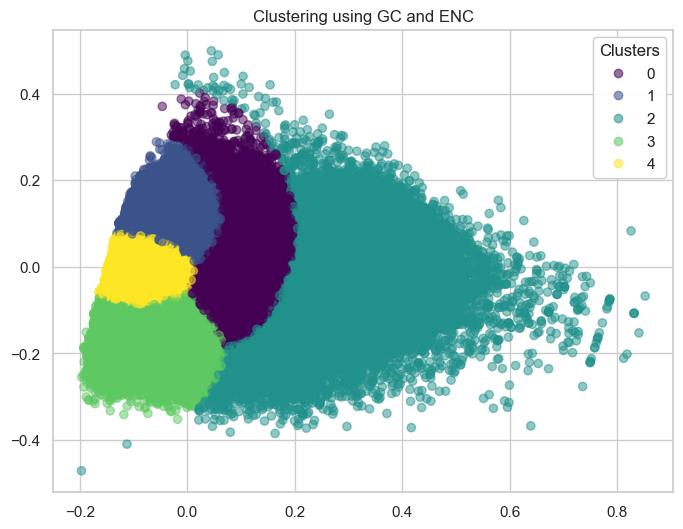

In [55]:
# 3. Clustering using GC3 and ENC
scaled_data = scale_features('gc', 'enc')
gmm = GaussianMixture(n_components=5, random_state=42)
clusters = gmm.fit_predict(scaled_data)
plot_clusters(apply_pca(scaled_data), clusters, 'Clustering using GC and ENC')

C:\Users\diwas\AppData\Local\Temp\ipykernel_12280\1299215374.py:29: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



<Axes: xlabel='gc', ylabel='enc'>

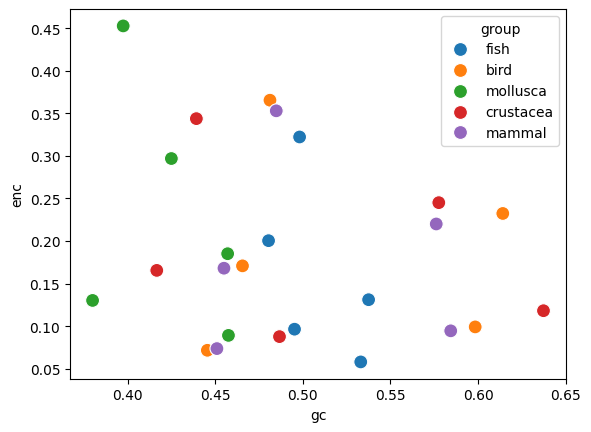

In [279]:
centroid_df = centroid_finder_GM(df, 'gc', 'enc')
sns.scatterplot(x='gc', y='enc', hue='group', data=centroid_df, s=100)

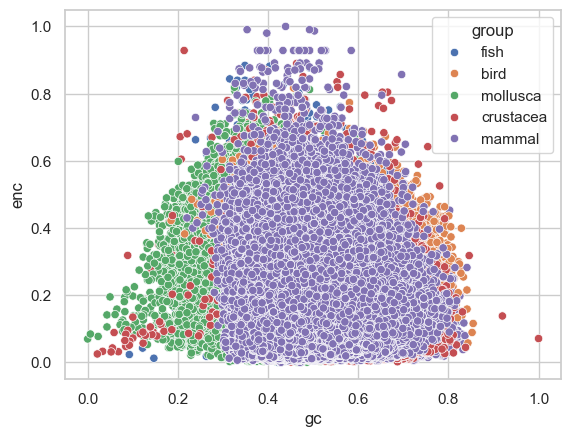

In [58]:
scaled_data = scale_features('gc', 'enc')
scaled_df = pd.DataFrame(scaled_data, columns=['gc', 'enc'])
scaled_df['group'] = df["group"]
sns.scatterplot(x="gc", y="enc", hue="group", data=scaled_df)
plt.show()

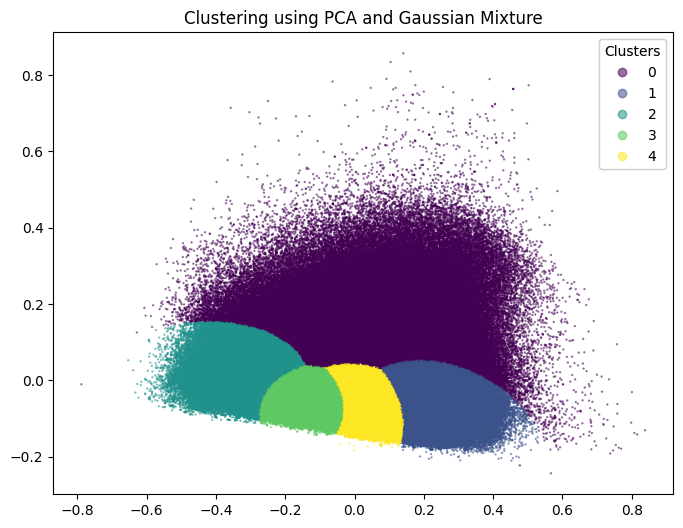

In [114]:
scaled_data = scale_features('gc', 'gc1','gc2','gc3', 'enc')
scaled_df = pd.DataFrame(scaled_data, columns=['gc', 'gc1','gc2','gc3', 'enc'])

pca_data = apply_pca(scaled_df)

gmm = GaussianMixture(n_components=5, random_state=42)

clusters = gmm.fit_predict(pca_data)

plot_clusters(pca_data, clusters, 'Clustering using PCA and Gaussian Mixture')


c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



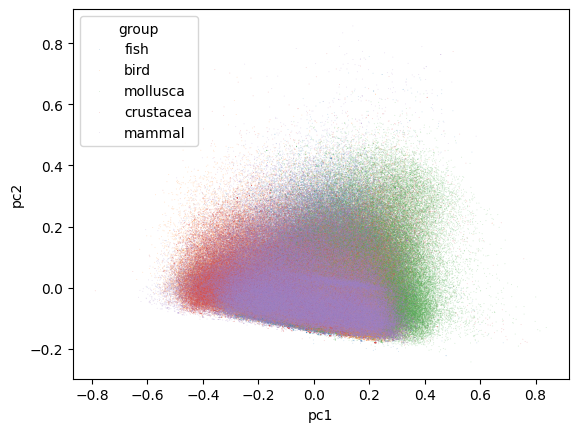

In [118]:
#plot_clusters(pca_data, df.loc[:, "group"], 'Clustering using PCA and Gaussian Mixture')
pca_df = pd.DataFrame(pca_data, columns=['pc1', 'pc2'])
pca_df['group'] = df["group"]
sns.scatterplot(x="pc1", y="pc2", hue="group", data=pca_df,alpha=0.2,s = 0.5)
plt.show()

In [116]:
pca_df

,pc1,pc2,group
0,0.286002,0.615748,fish
1,0.199929,0.756820,fish
2,0.196061,0.577339,fish
3,0.118021,0.226137,fish
4,0.135368,0.240870,fish
...,...,...,...
1074765,-0.065186,-0.117727,mammal
1074766,-0.065263,-0.117960,mammal
1074767,-0.071177,-0.117532,mammal
1074768,-0.066872,-0.117566,mammal


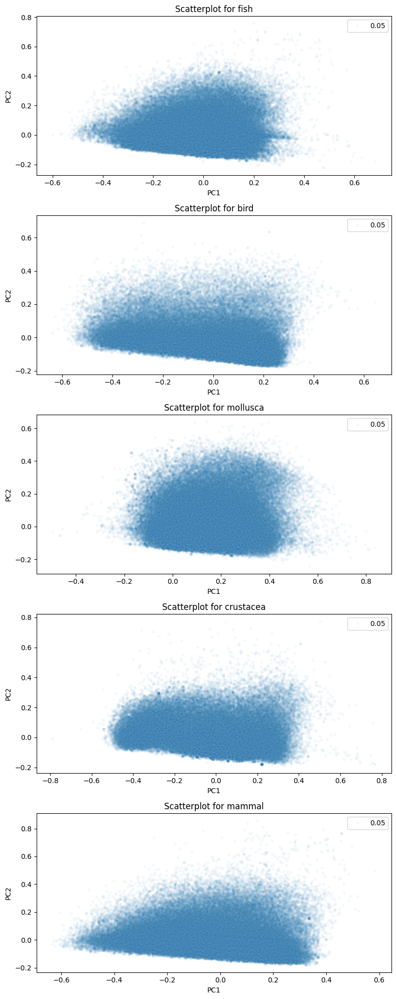

In [117]:


fig, axes = plt.subplots(5, 1, figsize=(8, 20))


for i, group in enumerate(pca_df['group'].unique()):

    group_data = pca_df[pca_df['group'] == group]
    

    sns.scatterplot(x='pc1', y='pc2', data=group_data, ax=axes[i], alpha=0.05,size= 0.05)
    axes[i].set_title(f'Scatterplot for {group}')
    axes[i].set_xlabel('PC1')
    axes[i].set_ylabel('PC2')


plt.tight_layout()

plt.show()


Fig: Distribution of the data based on different group 

In [64]:
from sklearn.preprocessing import StandardScaler

def standard_scale_features(*args):
    scaler = StandardScaler()
    return scaler.fit_transform(df[list(args)])

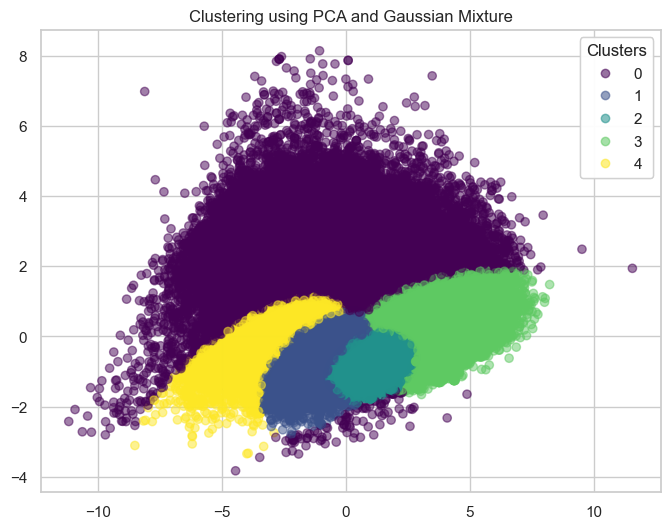

In [65]:
sscaled_data = standard_scale_features('gc', 'gc1','gc2','gc3', 'enc')
sscaled_df = pd.DataFrame(sscaled_data, columns=['gc', 'gc1','gc2','gc3', 'enc'])

spca_data = apply_pca(sscaled_df)


gmm = GaussianMixture(n_components=5, random_state=42)


clusters = gmm.fit_predict(spca_data)

plot_clusters(spca_data, clusters, 'Clustering using PCA and Gaussian Mixture')

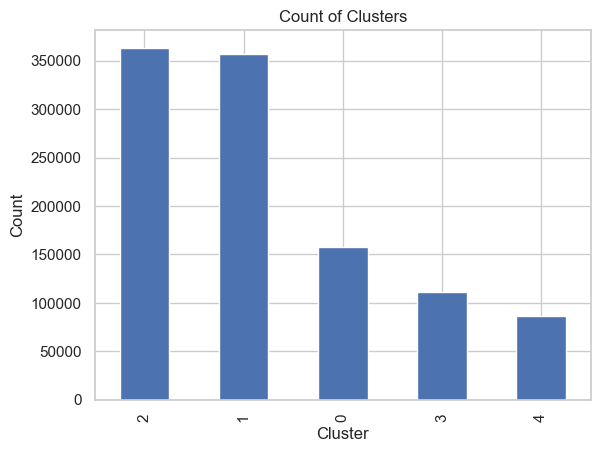

In [77]:
cluster_counts = pd.Series(clusters).value_counts()


cluster_counts.plot(kind='bar')


plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Count of Clusters')

plt.show()


c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



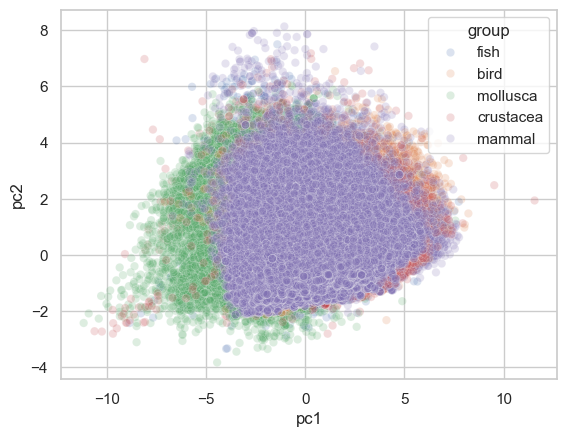

In [66]:
spca_df = pd.DataFrame(spca_data, columns=['pc1', 'pc2'])
spca_df['group'] = df["group"]
sns.scatterplot(x="pc1", y="pc2", hue="group", data=spca_df,alpha=0.2)
plt.show()

In [12]:
! pip install umap-learn

                                              0.0/90.9 kB ? eta -:--:--
     ------------------------------------     81.9/90.9 kB 2.3 MB/s eta 0:00:01
     ---------------------------------------- 90.9/90.9 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
                                              0.0/2.6 MB ? eta -:--:--
     -----                                    0.3/2.6 MB 10.6 MB/s eta 0:00:01
     -------------                            0.9/2.6 MB 10.9 MB/s eta 0:00:01
     ----------------                         1.1/2.6 MB 9.7 MB/s eta 0:00:01
     ----------------                         1.1/2.6 MB 9.7 MB/s eta 0:00:01
     -----------------                        1.1/2.6 MB 5.2 MB/s eta 0:00:01
     --------------------------               1.7/2.6 MB 6.5 MB/s eta 0:00:01
     -------------------------------          2.1/2.6 MB 6.6 MB/s eta 0:00:01
     ---------------------------------------  2

## Implement UMAP and Clustering

With the use of PCA, KMeans, Gaussian Mixture we were not satisfied with the outcome. So we want to find the better dimenstionality reduction method which we found is UMAP which is also suggested by the proffessor.

In [26]:
import umap

numerical_data = scale_features('gc', 'gc1', 'gc2', 'gc3', 'enc')
numerical_df = pd.DataFrame(numerical_data, columns=['gc', 'gc1', 'gc2', 'gc3', 'enc'])


In [27]:
numerical_df.head()

,gc,gc1,gc2,gc3,enc
0,0.403594,0.403661,0.450000,0.400000,0.788942
1,0.472427,0.504577,0.500000,0.444444,0.928455
2,0.445515,0.371793,0.526316,0.473684,0.732648
3,0.467799,0.455108,0.500000,0.480392,0.381346
4,0.458796,0.419648,0.514851,0.475248,0.394347


In [28]:

umap_data = umap.UMAP(n_components=3).fit_transform(numerical_df)


umap_df = pd.DataFrame(umap_data, columns=['UMAP1', 'UMAP2', 'UMAP3'])

umap_df['group'] = df['group']

In [153]:
from sklearn.preprocessing import LabelEncoder


encoder = LabelEncoder()

umap_df['group_encoded'] = encoder.fit_transform(umap_df['group'])


In [154]:
umap_df.head()

,UMAP1,UMAP2,UMAP3,group,group_encoded
0,6.121186,11.831045,-2.658334,fish,2
1,6.670545,11.541875,-2.750332,fish,2
2,6.257294,11.616166,-2.641646,fish,2
3,6.099245,9.457364,-2.031618,fish,2
4,6.021930,9.754585,-1.976894,fish,2


In [155]:
umap_df['group_encoded'].value_counts()

group_encoded
2    401206
4    226833
3    188254
0    134446
1    124031
Name: count, dtype: int64

In [39]:
clusterable_embedding = umap.UMAP(
    n_neighbors=300,
    min_dist=0.0,
    n_components=3,
    random_state=42,
).fit_transform(numerical_df)

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [156]:
clusterable_embed_df = pd.DataFrame(clusterable_embedding, columns=['UMAP1', 'UMAP2', 'UMAP3'])
clusterable_embed_df['group'] = df['group']
clusterable_embed_df['group_encoded'] = encoder.fit_transform(clusterable_embed_df['group'])

In [157]:
clusterable_embed_df

,UMAP1,UMAP2,UMAP3,group,group_encoded
0,1.884894,9.642516,3.201491,fish,2
1,2.244821,9.513179,3.172394,fish,2
2,2.204589,9.469957,3.220860,fish,2
3,2.659631,8.217629,3.697241,fish,2
4,2.500148,8.362083,3.717391,fish,2


In [ ]:
clusterable_embed_df['group_'].value_counts()

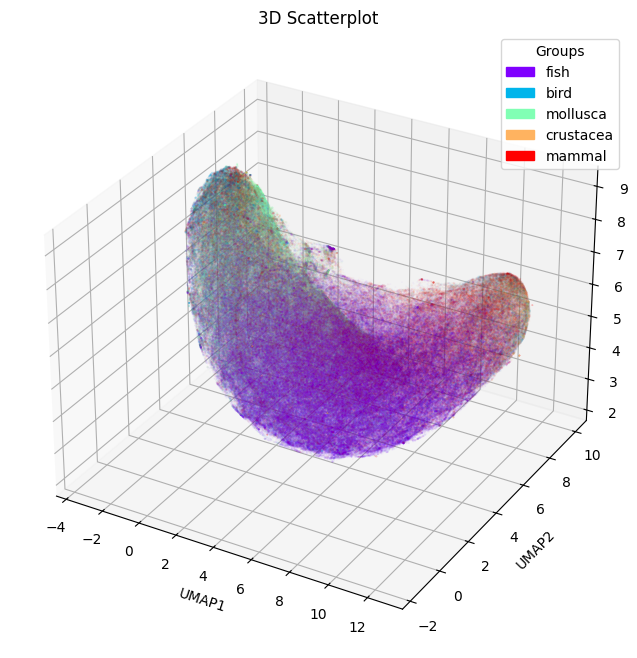

In [81]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')


opacity = 0.05
size = .05


unique_groups = clusterable_embed_df['group'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
color_map = dict(zip(unique_groups, colors))


c = clusterable_embed_df['group'].map(color_map)


scatter = ax.scatter(clusterable_embed_df['UMAP1'], clusterable_embed_df['UMAP2'], clusterable_embed_df['UMAP3'], c=c, alpha=opacity, s=size)


patch_list = [mpatches.Patch(color=color_map[group], label=group) for group in unique_groups]
ax.legend(handles=patch_list, title="Groups")


ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title('3D Scatterplot')

plt.show()

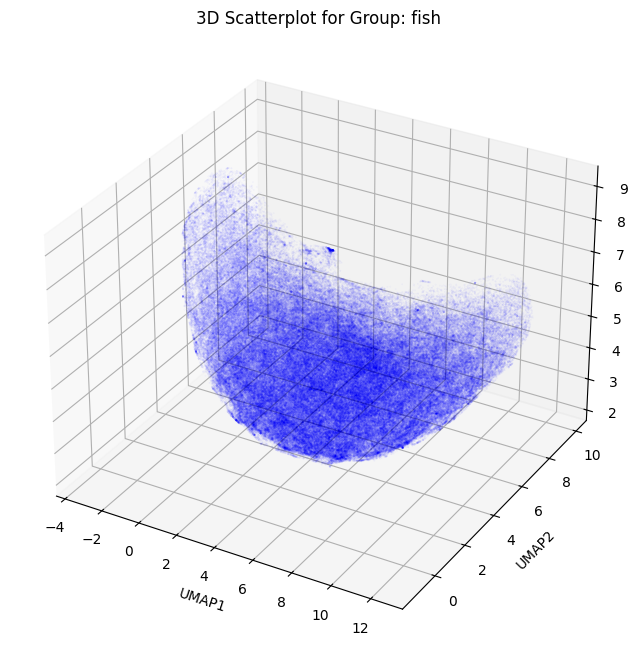

In [78]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.patches as mpatches

# Create a figure and subplots
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Set the opacity and size of the points
opacity = 0.05
size = .05

# Create a color map
unique_groups = clusterable_embed_df['group'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
color_map = dict(zip(unique_groups, colors))

# Iterate over each group
group = 'fish'
# Filter data for the current group
group_data = clusterable_embed_df[clusterable_embed_df['group'] == group]
    
# Convert groups to colors using the color map
c = group_data['group'].map(color_map)
    
# Plot the 3D scatterplot for the current group
scatter = ax.scatter(group_data['UMAP1'], group_data['UMAP2'], group_data['UMAP3'], c="blue", alpha=opacity, s=size)

# Set the labels and title for the current group
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title(f'3D Scatterplot for Group: {group}')
    
# Show the plot for the current group
plt.show()


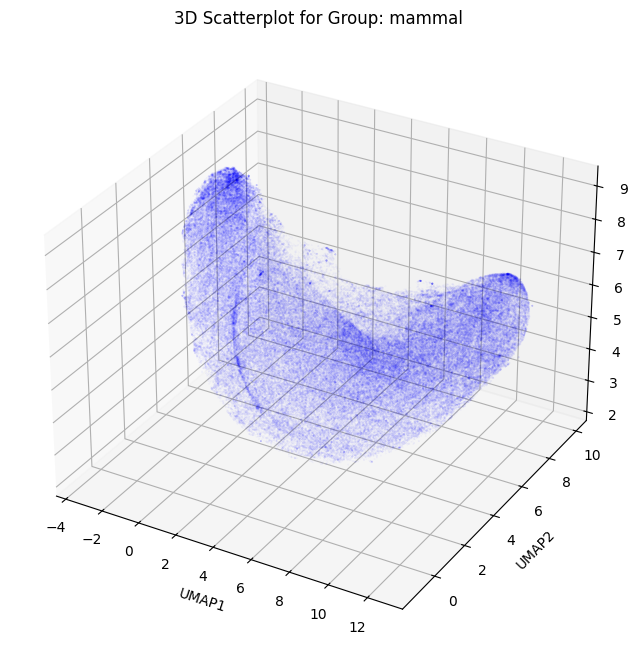

In [80]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Set the opacity and size of the points
opacity = 0.05
size = .05

# Create a color map
unique_groups = clusterable_embed_df['group'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
color_map = dict(zip(unique_groups, colors))

# Iterate over each group
group = 'mammal'
# Filter data for the current group
group_data = clusterable_embed_df[clusterable_embed_df['group'] == group]
    
# Convert groups to colors using the color map
c = group_data['group'].map(color_map)
    
# Plot the 3D scatterplot for the current group
scatter = ax.scatter(group_data['UMAP1'], group_data['UMAP2'], group_data['UMAP3'], c="blue", alpha=opacity, s=size)

# Set the labels and title for the current group
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title(f'3D Scatterplot for Group: {group}')
    
# Show the plot for the current group
plt.show()

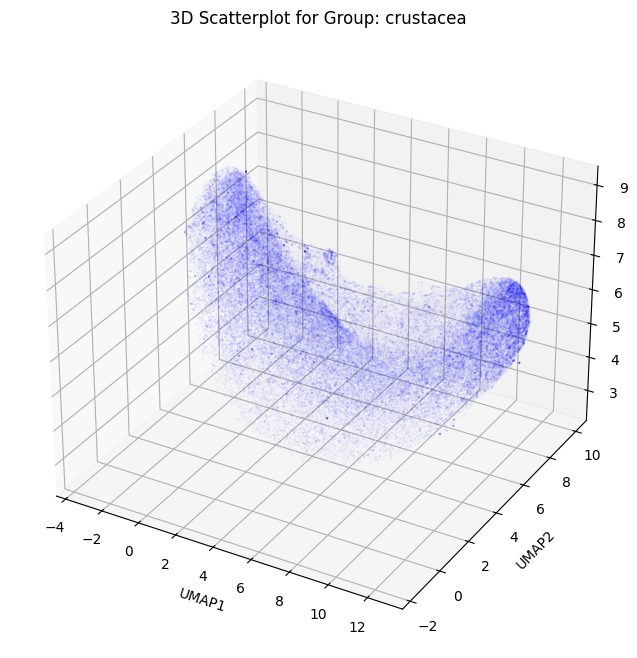

In [79]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')


opacity = 0.05
size = .05


unique_groups = clusterable_embed_df['group'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
color_map = dict(zip(unique_groups, colors))


group = 'crustacea'
group_data = clusterable_embed_df[clusterable_embed_df['group'] == group]
    
c = group_data['group'].map(color_map)
    
scatter = ax.scatter(group_data['UMAP1'], group_data['UMAP2'], group_data['UMAP3'], c="blue", alpha=opacity, s=size)

ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title(f'3D Scatterplot for Group: {group}')
    
plt.show()

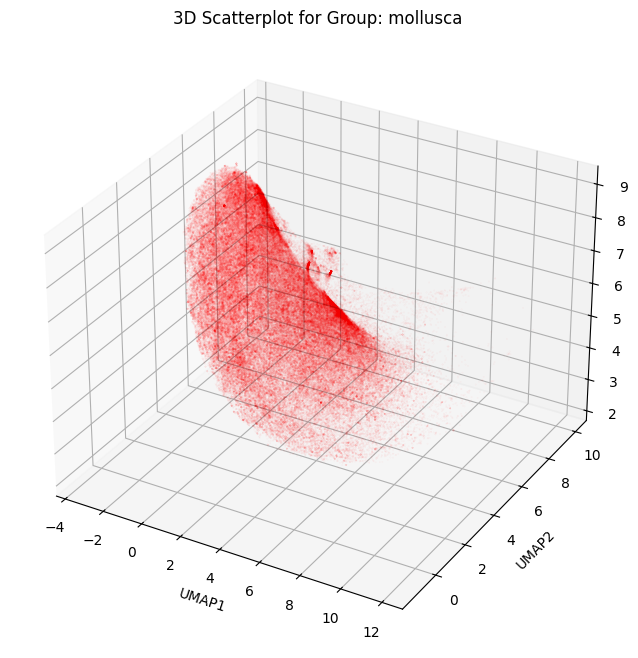

In [82]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

opacity = 0.05
size = .05


unique_groups = clusterable_embed_df['group'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
color_map = dict(zip(unique_groups, colors))


group = 'mollusca'

group_data = clusterable_embed_df[clusterable_embed_df['group'] == group]
    
c = group_data['group'].map(color_map)
    

scatter = ax.scatter(group_data['UMAP1'], group_data['UMAP2'], group_data['UMAP3'], c="red", alpha=opacity, s=size)

ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title(f'3D Scatterplot for Group: {group}')
    
plt.show()

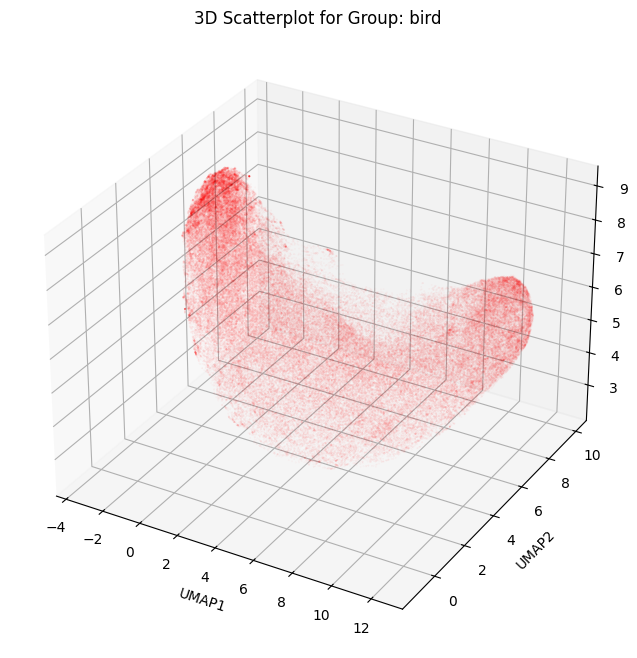

In [198]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')


opacity = 0.05
size = .05

unique_groups = clusterable_embed_df['group'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
color_map = dict(zip(unique_groups, colors))

group = 'bird'
group_data = clusterable_embed_df[clusterable_embed_df['group'] == group]
    
c = group_data['group'].map(color_map)
    
scatter = ax.scatter(group_data['UMAP1'], group_data['UMAP2'], group_data['UMAP3'], c="red", alpha=opacity, s=size)

ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title(f'3D Scatterplot for Group: {group}')
    
plt.show()

In [84]:
clusterable_embed_df.groupby('group').describe()

UMAP1                                                    \
              count      mean       std       min       25%       50%   
group                                                                   
bird       134446.0  4.205091  4.863969 -3.376724 -0.320257  3.593677   
crustacea  124031.0  4.810752  4.829217 -3.343418  0.309419  4.699665   
fish       401206.0  6.008758  3.356334 -3.322983  3.636183  6.198040   
mammal     188254.0  4.958563  4.620995 -3.353633  0.817578  5.239530   
mollusca   226833.0  1.000865  2.644986 -3.353938 -1.121784  0.680608   

                                   UMAP2            ...                       \
                75%        max     count      mean  ...       75%        max   
group                                               ...                        
bird       8.992263  12.411756  134446.0  4.800733  ...  6.709828   9.987427   
crustacea  9.575022  12.605090  124031.0  5.703807  ...  7.627241   9.992067   
fish       8.658036  12.431174  401206.0  3.053456  ...  4.612688   9.971974   
mammal     9.251287  12.605762  188254.0  4.902022  ...  6.821815   9.964833   
mollusca   2.700536  11.879217  226833.0  5.411114  ...  7.677474  10.014782   

              UMAP3                                                    \
              count      mean       std       min       25%       50%   
group                                                                   
bird       134446.0  6.064104  1.579353  2.377309  4.871813  6.062983   
crustacea  124031.0  5.732609  1.441875  2.563370  4.628684  5.721747   
fish       401206.0  5.343842  1.349149  2.165858  4.298559  5.295037   
mammal     188254.0  5.708334  1.530996  2.220513  4.494577  5.741183   
mollusca   226833.0  5.483285  1.575342  2.190148  4.081711  5.460313   

                               
                75%       max  
group                          
bird       7.361889  9.085883  
crustacea  6.763781  9.064448  
fish       6.349368  9.103227  
mammal     6.794646  9.092001  
mollusca   6.791272  9.038424  

[5 rows x 24 columns]

In [119]:
gmm = GaussianMixture(n_components=5, random_state=42)
clusters = gmm.fit_predict(clusterable_embedding)
gmm_df = pd.DataFrame(clusterable_embedding, columns=['UMAP1', 'UMAP2', 'UMAP3'])
gmm_df['group'] = df['group']
gmm_df['clusters'] = clusters

In [151]:
embedding_df = pd.DataFrame(clusterable_embedding, columns=['UMAP1', 'UMAP2', 'UMAP3'])
embedding_df['group'] = df['group']

clustered_df = pd.DataFrame(columns=['UMAP1', 'UMAP2', 'UMAP3', 'group', 'cluster'])

for group in embedding_df['group'].unique():
    group_data = embedding_df[embedding_df['group'] == group][['UMAP1', 'UMAP2', 'UMAP3']]
    

    gmm = GaussianMixture(n_components=5, random_state=42)
    
    clusters = gmm.fit_predict(group_data)
    
    group_data['cluster'] = clusters
    group_data['group'] = group
    clustered_df = pd.concat([clustered_df, group_data], ignore_index=True)

print(clustered_df)


C:\Users\diwas\AppData\Local\Temp\ipykernel_12280\2637403245.py:25: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



            UMAP1     UMAP2     UMAP3   group cluster
0        1.884894  9.642516  3.201491    fish       0
1        2.244821  9.513179  3.172394    fish       0
2        2.204589  9.469957  3.220860    fish       0
3        2.659631  8.217629  3.697241    fish       0
4        2.500148  8.362083  3.717391    fish       0
...           ...       ...       ...     ...     ...
1074765  6.365020  2.410559  7.943131  mammal       3
1074766  6.363176  2.413466  7.943274  mammal       3
1074767  6.383157  2.430406  7.940224  mammal       3
1074768  6.367987  2.412649  7.941740  mammal       3
1074769  3.253832  2.809646  3.228017  mammal       0

[1074770 rows x 5 columns]


In [270]:
clustered_df.head()

,UMAP1,UMAP2,UMAP3,group,cluster
0,1.884894,9.642516,3.201491,fish,0
1,2.244821,9.513179,3.172394,fish,0
2,2.204589,9.469957,3.220860,fish,0
3,2.659631,8.217629,3.697241,fish,0
4,2.500148,8.362083,3.717391,fish,0


In [159]:
clusterable_embed_df.head()

,UMAP1,UMAP2,UMAP3,group,group_encoded
0,1.884894,9.642516,3.201491,fish,2
1,2.244821,9.513179,3.172394,fish,2
2,2.204589,9.469957,3.220860,fish,2
3,2.659631,8.217629,3.697241,fish,2
4,2.500148,8.362083,3.717391,fish,2


In [271]:
clustered_df['cluster'].value_counts().

cluster
1    292542
4    222273
0    207813
2    177521
3    174621
Name: count, dtype: int64

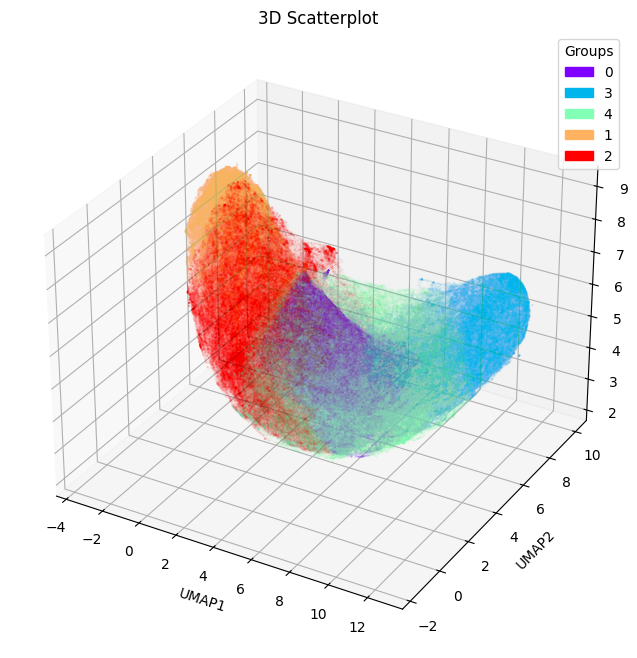

In [121]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

opacity = 0.05
size = 0.05

unique_groups = gmm_df['clusters'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
color_map = dict(zip(unique_groups, colors))


c = gmm_df['clusters'].map(color_map)

scatter = ax.scatter(gmm_df['UMAP1'], gmm_df['UMAP2'], gmm_df['UMAP3'], c=c, alpha=opacity, s=size)

patch_list = [mpatches.Patch(color=color_map[group], label=group) for group in unique_groups]
ax.legend(handles=patch_list, title="Groups")

ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title('3D Scatterplot')

plt.show()

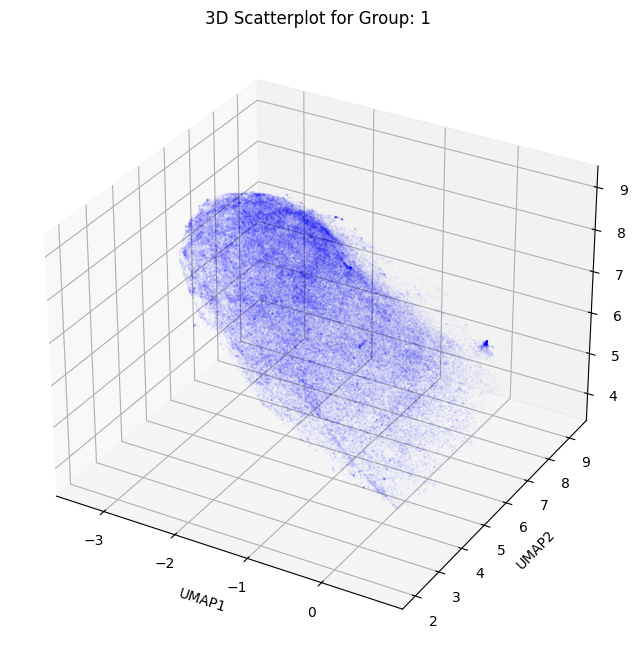

In [127]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')


opacity = 0.05
size = .05


unique_groups = gmm_df['clusters'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
color_map = dict(zip(unique_groups, colors))


group = 1

group_data = gmm_df[gmm_df['clusters'] == group]
    

c = group_data['clusters'].map(color_map)
    

scatter = ax.scatter(group_data['UMAP1'], group_data['UMAP2'], group_data['UMAP3'], c="blue", alpha=opacity, s=size)


ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title(f'3D Scatterplot for Group: {group}')
    
plt.show()

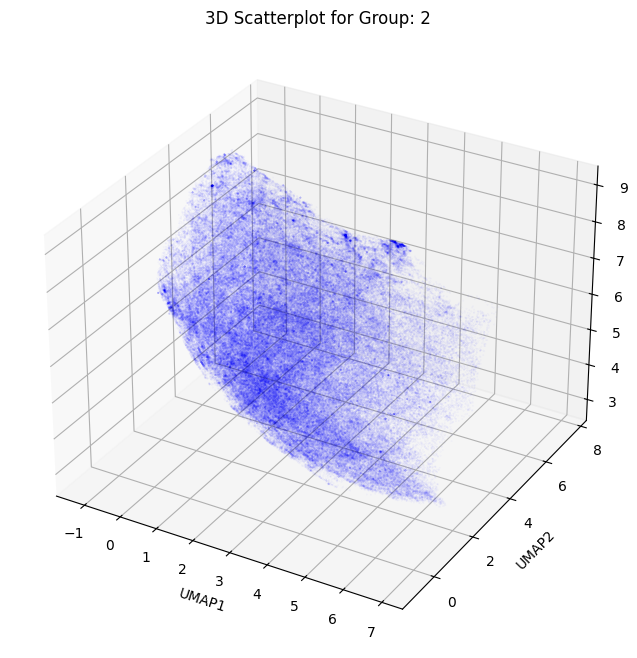

In [126]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')


opacity = 0.05
size = .05


unique_groups = gmm_df['clusters'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
color_map = dict(zip(unique_groups, colors))


group = 2

group_data = gmm_df[gmm_df['clusters'] == group]
    

c = group_data['clusters'].map(color_map)
    
scatter = ax.scatter(group_data['UMAP1'], group_data['UMAP2'], group_data['UMAP3'], c="blue", alpha=opacity, s=size)

ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title(f'3D Scatterplot for Group: {group}')
    
plt.show()

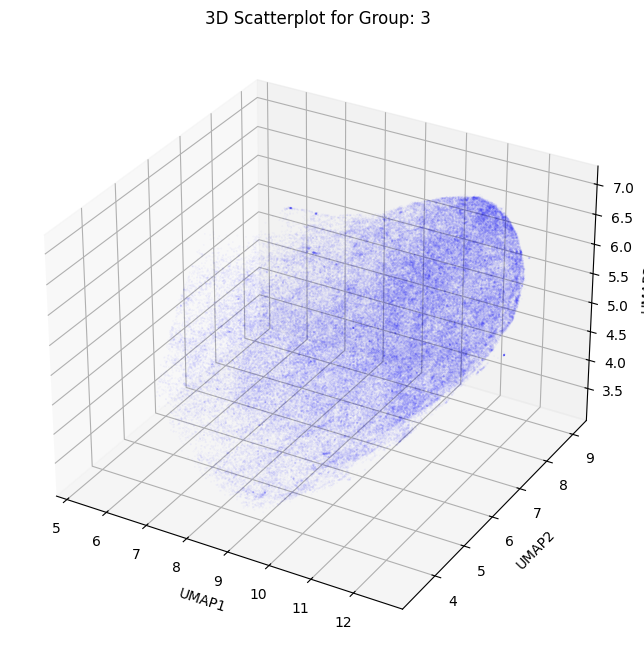

In [128]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')


opacity = 0.05
size = .05

unique_groups = gmm_df['clusters'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
color_map = dict(zip(unique_groups, colors))


group = 3

group_data = gmm_df[gmm_df['clusters'] == group]
    

c = group_data['clusters'].map(color_map)
    

scatter = ax.scatter(group_data['UMAP1'], group_data['UMAP2'], group_data['UMAP3'], c="blue", alpha=opacity, s=size)

ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title(f'3D Scatterplot for Group: {group}')
    
plt.show()

In [137]:
def scatterplot_3d(df, group, size=0.05, opacity=0.05, title=None):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

   
    opacity = 0.05
    size = .05

    
    unique_groups = df['clusters'].unique()
    colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
    color_map = dict(zip(unique_groups, colors))

   
    group = group
    
    group_data = df[df['clusters'] == group]


    c = group_data['clusters'].map(color_map)

    
    scatter = ax.scatter(group_data['UMAP1'], group_data['UMAP2'], group_data['UMAP3'], c="blue", alpha=opacity, s=size)

   
    ax.set_xlabel('UMAP1')
    ax.set_ylabel('UMAP2')
    ax.set_zlabel('UMAP3')
    ax.set_title(f'3D Scatterplot for Group: {group}')

    plt.show()

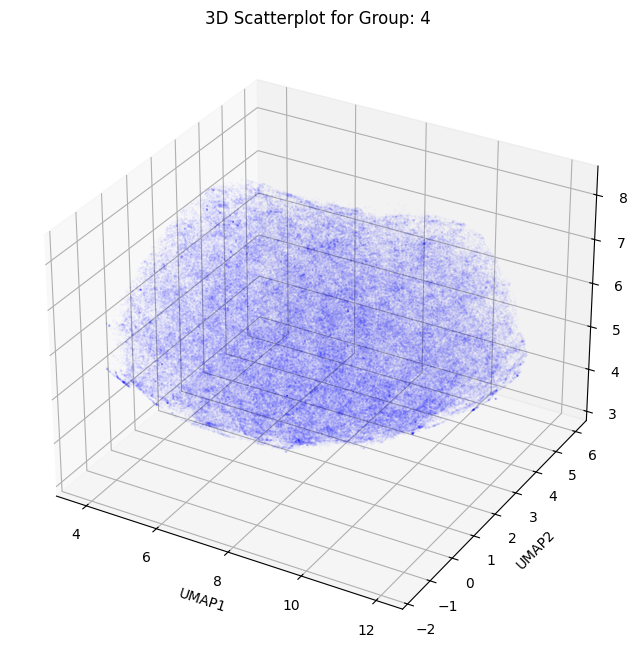

In [134]:
scatterplot_3d(gmm_df, 4)

In [136]:
gmm.means_

array([[ 3.19150313,  6.65726947,  3.64707262],
       [-1.56341721,  5.94532179,  6.71982687],
       [ 2.56675998,  2.61136374,  6.13288444],
       [10.01818442,  6.51927168,  5.30747147],
       [ 7.80415819,  2.04372419,  5.75232625]])

In [150]:
group_centroid = pd.DataFrame(gmm.means_, columns=['UMAP1', 'UMAP2', 'UMAP3'])
group_centroid['group'] = ['0','1','2','3','4']
import plotly.express as px


fig = px.scatter_3d(group_centroid, x='UMAP1', y='UMAP2', z='UMAP3', opacity=1, color='group',size=[1,1,1,1,1])
fig.show()


In [59]:
clusterable_embed_df.to_csv("clusterable_embed_df.csv",index=False)
umap_df.to_csv("umap_df.csv",index=False)

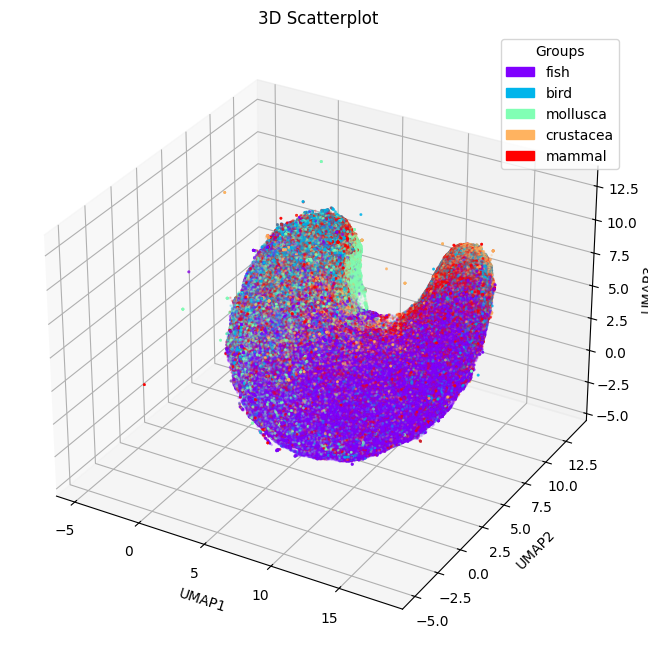

In [38]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.patches as mpatches

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

opacity = 0.2
size = 1

unique_groups = clusterable_embed_df['group'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
color_map = dict(zip(unique_groups, colors))


c = umap_df['group'].map(color_map)

scatter = ax.scatter(umap_df['UMAP1'], umap_df['UMAP2'], umap_df['UMAP3'], c=c, alpha=opacity, s=size)


patch_list = [mpatches.Patch(color=color_map[group], label=group) for group in unique_groups]
ax.legend(handles=patch_list, title="Groups")


ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title('3D Scatterplot')


plt.show()

In [160]:
fish_df = embedding_df[embedding_df['group'] == "fish"][['UMAP1', 'UMAP2', 'UMAP3']]   
mammal_df = embedding_df[embedding_df['group'] == "mammal"][['UMAP1', 'UMAP2', 'UMAP3']]
crustacea_df = embedding_df[embedding_df['group'] == "crustacea"][['UMAP1', 'UMAP2', 'UMAP3']]
mollusca_df = embedding_df[embedding_df['group'] == "mollusca"][['UMAP1', 'UMAP2', 'UMAP3']]
bird_df = embedding_df[embedding_df['group'] == "bird"][['UMAP1', 'UMAP2', 'UMAP3']] 


gmm = GaussianMixture(n_components=5, random_state=42)
    
clusters = gmm.fit_predict(fish_df)

In [165]:
centroid_df = pd.DataFrame(gmm.means_, columns=['UMAP1', 'UMAP2', 'UMAP3'])
centroid_df['group'] = ['fish','fish','fish','fish','fish']

In [166]:
centroid_df

,UMAP1,UMAP2,UMAP3,group
0,5.361313,5.019035,3.676289,fish
1,7.682648,1.447523,5.993779,fish
2,10.175079,4.554455,5.266787,fish
3,0.453676,3.812836,5.853584,fish
4,4.360775,1.801761,5.837445,fish


In [169]:
clusters = gmm.fit_predict(mammal_df)
centroid_df_mammal = pd.DataFrame(gmm.means_, columns=['UMAP1', 'UMAP2', 'UMAP3'])
centroid_df_mammal['group'] = ['mammal','mammal','mammal','mammal','mammal']

In [171]:
clusters = gmm.fit_predict(crustacea_df)
centroid_df_crustacea = pd.DataFrame(gmm.means_, columns=['UMAP1', 'UMAP2', 'UMAP3'])
centroid_df_crustacea['group'] = ['crustacea','crustacea','crustacea','crustacea','crustacea']

In [172]:
clusters = gmm.fit_predict(mollusca_df)
centroid_df_mollusca = pd.DataFrame(gmm.means_, columns=['UMAP1', 'UMAP2', 'UMAP3'])
centroid_df_mollusca['group'] = ['mollusca','mollusca','mollusca','mollusca','mollusca']

In [173]:
clusters = gmm.fit_predict(bird_df)
centroid_df_bird = pd.DataFrame(gmm.means_, columns=['UMAP1', 'UMAP2', 'UMAP3'])
centroid_df_bird['group'] = ['bird','bird','bird','bird','bird']

In [175]:
combined_df = pd.concat([centroid_df, centroid_df_mammal,centroid_df_crustacea,centroid_df_mollusca,centroid_df_bird], ignore_index=True)


In [195]:
fig = plt.figure(figsize=(15, 10))
fig = px.scatter_3d(combined_df, x='UMAP1', y='UMAP2', z='UMAP3', opacity=1, color='group')
fig.show()


<Figure size 1500x1000 with 0 Axes>

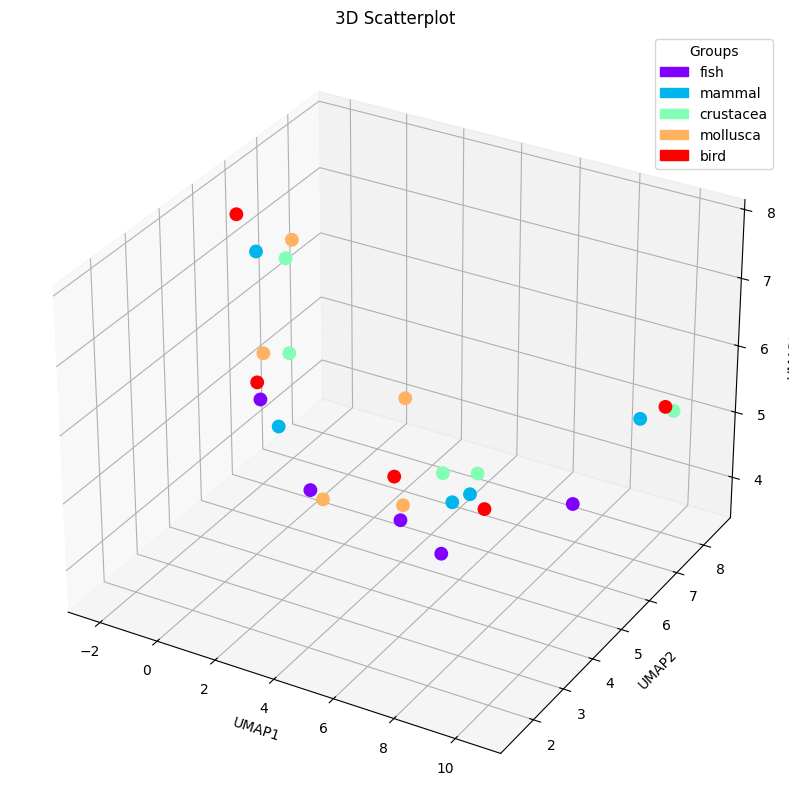

In [194]:
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

opacity = 1
size = 80


unique_groups = combined_df['group'].unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_groups)))
color_map = dict(zip(unique_groups, colors))

c = combined_df['group'].map(color_map)


scatter = ax.scatter(combined_df['UMAP1'], combined_df['UMAP2'], combined_df['UMAP3'], c=c, alpha=opacity, s=size)

patch_list = [mpatches.Patch(color=color_map[group], label=group) for group in unique_groups]
ax.legend(handles=patch_list, title="Groups")

ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title('3D Scatterplot')

plt.show()

<Axes: xlabel='UMAP1', ylabel='UMAP2'>

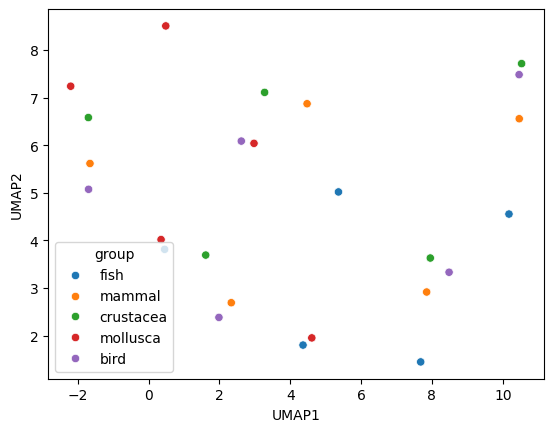

In [185]:
sns.scatterplot(x="UMAP1", y="UMAP2", hue="group", data=combined_df)

<Axes: xlabel='UMAP1', ylabel='UMAP3'>

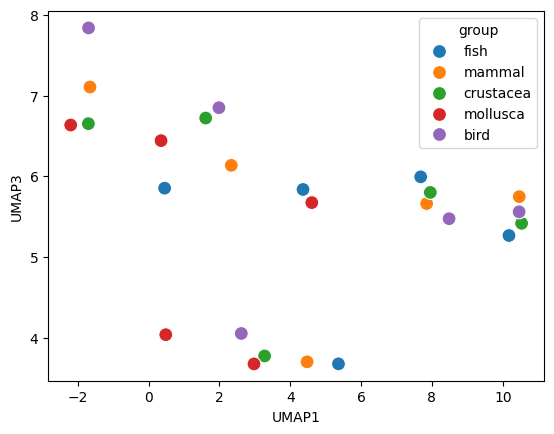

In [190]:
sns.scatterplot(x="UMAP1", y="UMAP3", hue="group", data=combined_df,s= 100)

In [197]:

umap_2data = umap.UMAP(n_components=2).fit_transform(numerical_df)

umap_2df = pd.DataFrame(umap_2data, columns=['UMAP1', 'UMAP2'])

umap_2df['group'] = df['group']

In [199]:
from sklearn.mixture import GaussianMixture

# Create a DataFrame to store the centroids
centroids_df = pd.DataFrame(columns=['UMAP1', 'UMAP2', 'group'])

# Iterate over each group
for group in umap_2df['group'].unique():
    # Filter data for the current group
    group_data = umap_2df[umap_2df['group'] == group][['UMAP1', 'UMAP2']]
    
    # Create Gaussian Mixture model
    gmm = GaussianMixture(n_components=5, random_state=42)
    
    # Fit the model on the data
    clusters = gmm.fit_predict(group_data)
    
    # Get the centroids of the clusters
    centroids = gmm.means_
    
    # Create a DataFrame to store the centroids for the current group
    group_centroids_df = pd.DataFrame(centroids, columns=['UMAP1', 'UMAP2'])
    group_centroids_df['group'] = group
    
    # Append the centroids to the centroids_df DataFrame
    centroids_df = pd.concat([centroids_df, group_centroids_df], ignore_index=True)

# Print the centroids for each group
print(centroids_df)


C:\Users\diwas\AppData\Local\Temp\ipykernel_12280\3107495848.py:25: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



        UMAP1      UMAP2      group
0    2.596695  10.074464       fish
1    7.907578   2.982258       fish
2   -3.892553   4.607734       fish
3   11.021465   8.663201       fish
4    2.164161   0.385474       fish
5   -0.602463  11.328165       bird
6    7.666425   5.138165       bird
7    9.265447  14.200255       bird
8   -2.632691   2.007921       bird
9   -8.786875   7.625248       bird
10  -1.719326  15.090683   mollusca
11  -5.614727   5.398497   mollusca
12  -0.350718   9.329099   mollusca
13  -7.411275  13.161882   mollusca
14   0.872927   1.080791   mollusca
15  -7.518710  10.198469  crustacea
16   8.976311  14.587175  crustacea
17  -0.558604  12.581865  crustacea
18  -2.399549   3.075630  crustacea
19   7.132700   6.188598  crustacea
20  -7.812271   8.895389     mammal
21   9.448560  12.799305     mammal
22   1.294564  12.319718     mammal
23   7.678592   5.424976     mammal
24  -1.127841   2.282822     mammal


In [200]:
centroids_df.head()

,UMAP1,UMAP2,group
0,2.596695,10.074464,fish
1,7.907578,2.982258,fish
2,-3.892553,4.607734,fish
3,11.021465,8.663201,fish
4,2.164161,0.385474,fish


C:\Users\diwas\AppData\Local\Temp\ipykernel_12280\2867594402.py:3: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



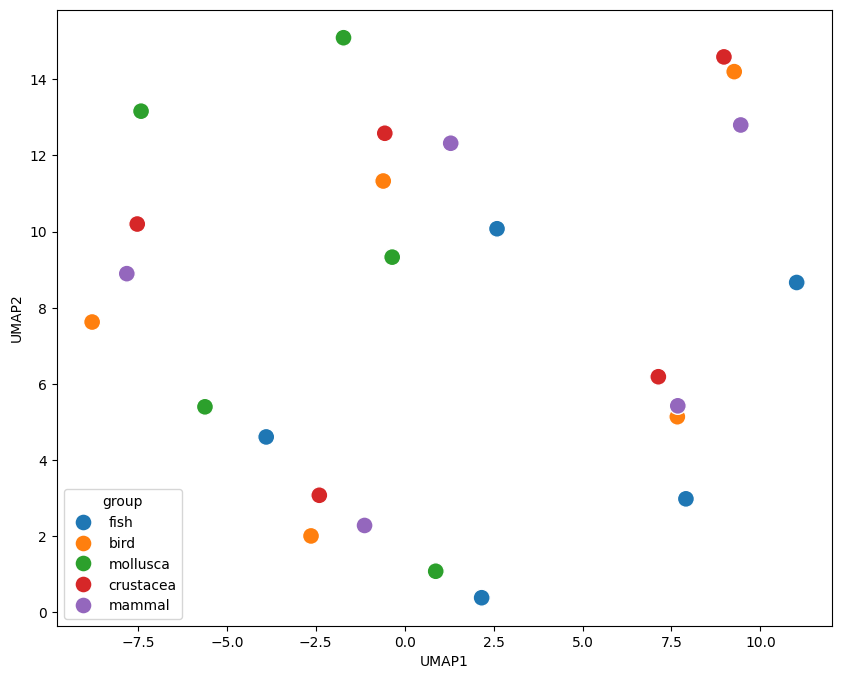

In [206]:
fig = plt.figure(figsize=(10, 8))
sns.scatterplot(x="UMAP1", y="UMAP2", hue="group", data=centroids_df,s= 150)
fig.show()

In [237]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
def centroid_finder(df, column1, column2):
    data = df[[column1, column2]]

    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(data)
    
    centroid_df = pd.DataFrame(columns=[column1, column2, 'group'])
    
    for group in df['group'].unique():
        group_data = scaled_data[df['group'] == group]
        
        gmm = KMeans(n_clusters=5, random_state=42)
        gmm.fit_predict(group_data)
        
        centroids = gmm.cluster_centers_
        
        group_centroids_df = pd.DataFrame(centroids, columns=[column1, column2])
        group_centroids_df['group'] = group
        
        centroid_df = pd.concat([centroid_df, group_centroids_df], ignore_index=True)
    
    return centroid_df


In [242]:
centroid_df = centroid_finder(df, 'gc', 'enc')

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\diwas\AppData\Local\Temp\ipykernel_12280\3839157607.py:36: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\diwas\anaconda3\envs\ai_base\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' i

<Axes: xlabel='gc', ylabel='enc'>

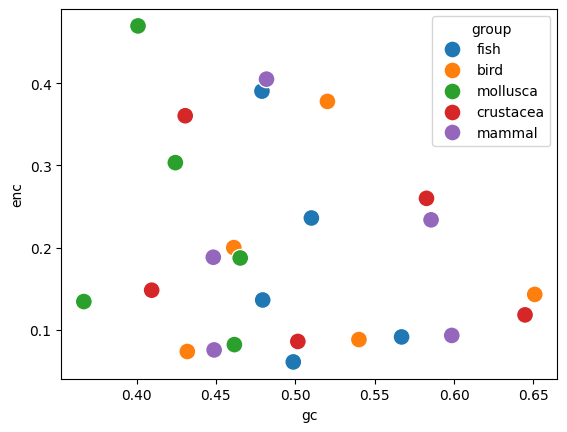

In [243]:
sns.scatterplot(x="gc", y="enc", hue="group", data=centroid_df,s= 150)